# Image Classification using HoG (10 points)

In [77]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os


In [78]:
path = "./"
q1_path = path + "Assignment2 Data/Q1/"


In [79]:
# Train and test set
train = []
test = []

N_train = 5
N_test = 5

dim = (128, 128)
# Define the path for our datasets
train_path = os.path.join(q1_path, "training")
test_path = os.path.join(q1_path, "test")

# Given a path the function returns a list containing the images in that path 
def read_images(path):
    imgs = []
    y = []
    for img in os.listdir(path):
        try:
            img_path = os.path.join(path, img)

            # Read the image logo of kraft and mc
            img1 = cv2.imread(img_path)
            img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

            # Resize the image
            img1 = cv2.resize(img1, dim)
            # Add the images to the training set
            imgs.append(img1)
            if "mc" in img:
                y.append("Mac")
            else:
                y.append("Kraft")
        except:
            pass

    return imgs, y


In [80]:
# Load train and test
train, y_train = read_images(train_path)
test, y_test = read_images(test_path)


In [81]:
def visualize_HoG(img, hog_descriptor, nbins, cell_size):

    # Calculate the average gradient for each cell
    ave_grad = hog_descriptor

    # Calculate the total number of vectors we have in all the cells.
    len_vecs = ave_grad.shape[0] * ave_grad.shape[1] * ave_grad.shape[2]

    # Create an array that has num_bins equally spaced between 0 and 180 degress in radians.
    deg = np.linspace(0, np.pi, nbins, endpoint=False)

    # Each cell will have a histogram with num_bins. For each cell, plot each bin as a vector (with its magnitude
    # equal to the height of the bin in the histogram, and its angle corresponding to the bin in the histogram).
    # To do this, create rank 1 arrays that will hold the (x,y)-coordinate of all the vectors in all the cells in the
    # image. Also, create the rank 1 arrays that will hold all the (U,V)-components of all the vectors in all the
    # cells in the image. Create the arrays that will hold all the vector positons and components.
    U = np.zeros((len_vecs))
    V = np.zeros((len_vecs))
    X = np.zeros((len_vecs))
    Y = np.zeros((len_vecs))

    # Set the counter to zero
    counter = 0

    # Use the cosine and sine functions to calculate the vector components (U,V) from their maginitudes. Remember the
    # cosine and sine functions take angles in radians. Calculate the vector positions and magnitudes from the
    # average gradient array
    for i in range(ave_grad.shape[0]):
        for j in range(ave_grad.shape[1]):
            for k in range(ave_grad.shape[2]):
                U[counter] = ave_grad[i, j, k] * np.cos(deg[k])
                V[counter] = ave_grad[i, j, k] * np.sin(deg[k])

                X[counter] = (cell_size[0] / 2) + (cell_size[0] * i)
                Y[counter] = (cell_size[1] / 2) + (cell_size[1] * j)

                counter = counter + 1

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    # Display the image
    ax1.set(title='Grayscale Image')
    ax1.imshow(img, cmap='gray')

    # Plot the feature vector (HOG Descriptor)
    ax2.set(title='HOG Descriptor')
    ax2.quiver(Y, X, U, V, color='white', headwidth=0,
               headlength=0, scale_units='inches', scale=3)
    ax2.invert_yaxis()
    ax2.set_aspect(aspect=1)
    ax2.set_facecolor('black')


In [82]:
def compute_HoG(imgs):

    def block_norm(hog_desc, n_cells):
        # Define BlockNorm
        gradients = np.full((n_cells[0], n_cells[1], nbins), 0, dtype=float)
        cell_count = np.full((n_cells[0], n_cells[1], 1), 0, dtype=int)

        for off_y in range(block_size[0]):
            for off_x in range(block_size[1]):
                gradients[off_y:n_cells[0] - block_size[0] + off_y + 1,
                          off_x:n_cells[1] - block_size[1] + off_x + 1] += \
                    hog_desc[:, :, off_y, off_x, :]
                cell_count[off_y:n_cells[0] - block_size[0] + off_y + 1,
                           off_x:n_cells[1] - block_size[1] + off_x + 1] += 1

        # Normalize gradients
        gradients /= cell_count
        return gradients

    img_size = (128, 128)  # h x w in pixels
    cell_size = (4, 4)  # h x w in pixels
    block_size = (4, 4)  # h x w in cells
    nbins = 8  # number of orientation bins

    # create HoG Object
    # winSize is the size of the image cropped to multiple of the cell size
    # all arguments should be given in terms of number of pixels
    hog = cv2.HOGDescriptor(_winSize=(img_size[1] // cell_size[1] * cell_size[1],
                                      img_size[0] // cell_size[0] * cell_size[0]),
                            _blockSize=(block_size[1] * cell_size[1],
                                        block_size[0] * cell_size[0]),
                            _blockStride=(
                                cell_size[1], cell_size[0]),
                            _cellSize=(cell_size[1], cell_size[0]),
                            _nbins=nbins,
                            )

    features = []

    for i in range(len(imgs)):
        feature = hog.compute(imgs[i]).reshape(1, -1)
        n_cells = (imgs[i].shape[0] // cell_size[0],
                   imgs[i].shape[1] // cell_size[1])
        feature = feature.reshape(n_cells[1] - block_size[1] + 1,
                                  n_cells[0] - block_size[0] + 1,
                                  block_size[0], block_size[1], nbins)\
            .transpose((1, 0, 2, 3, 4))
        feature = block_norm(feature, n_cells)
        visualize_HoG(imgs[i], feature, nbins, cell_size)
        features.append(feature.reshape(1, -1))
    features = np.vstack(features)
    return features


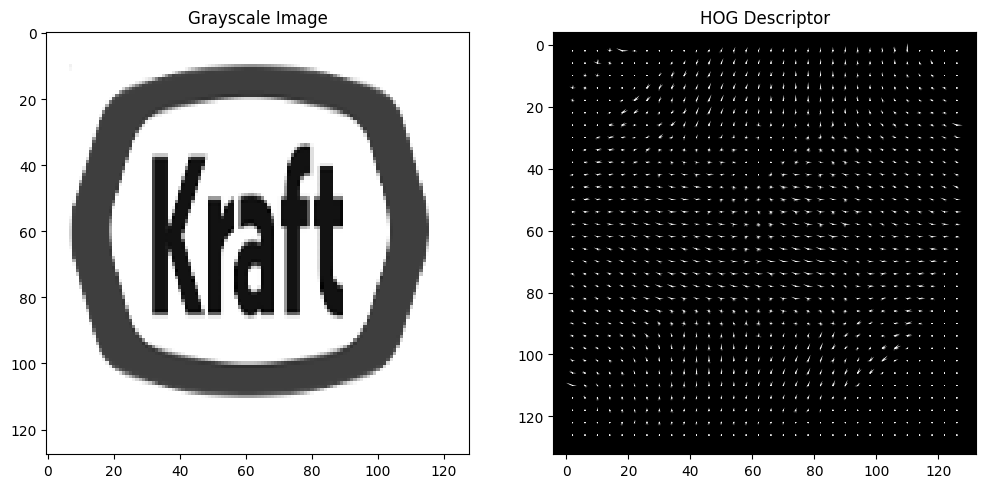

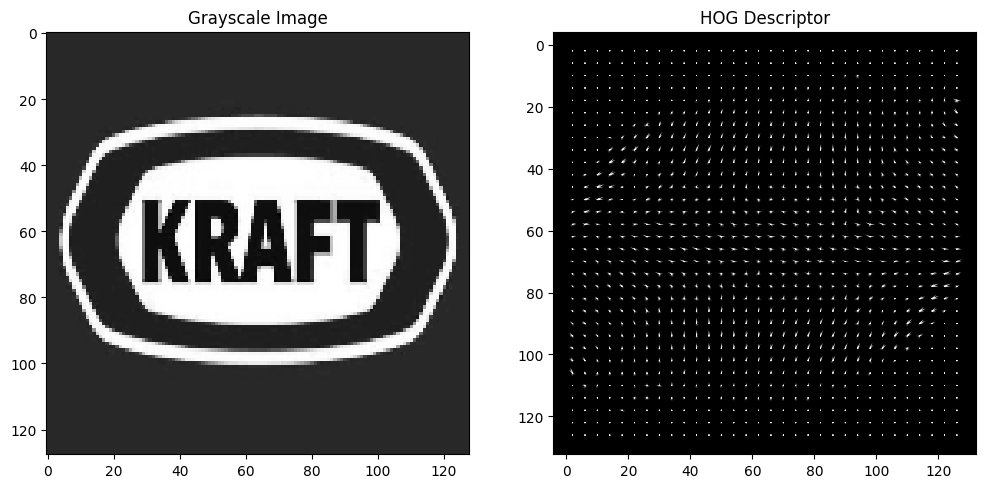

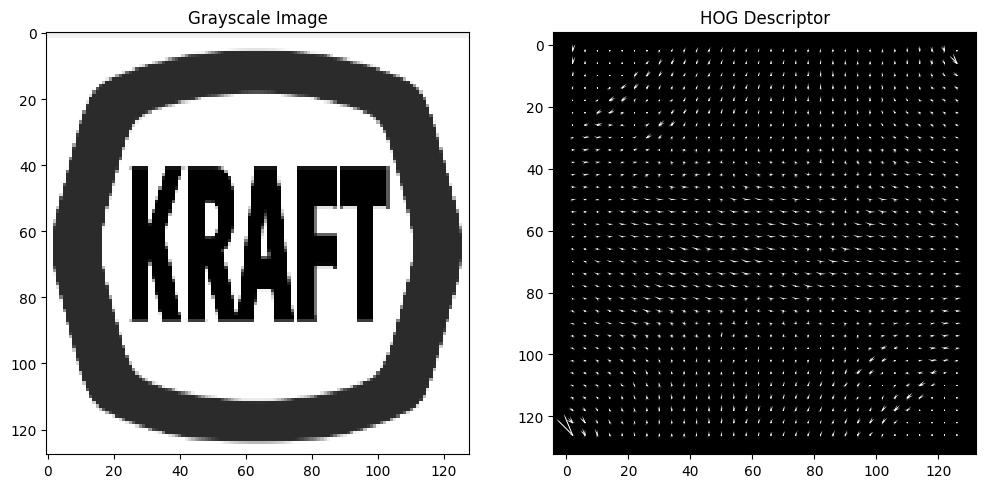

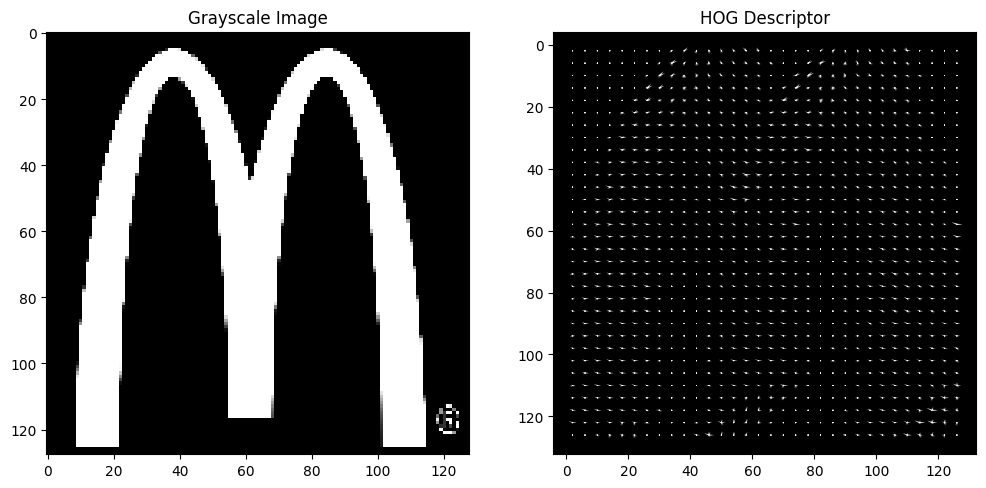

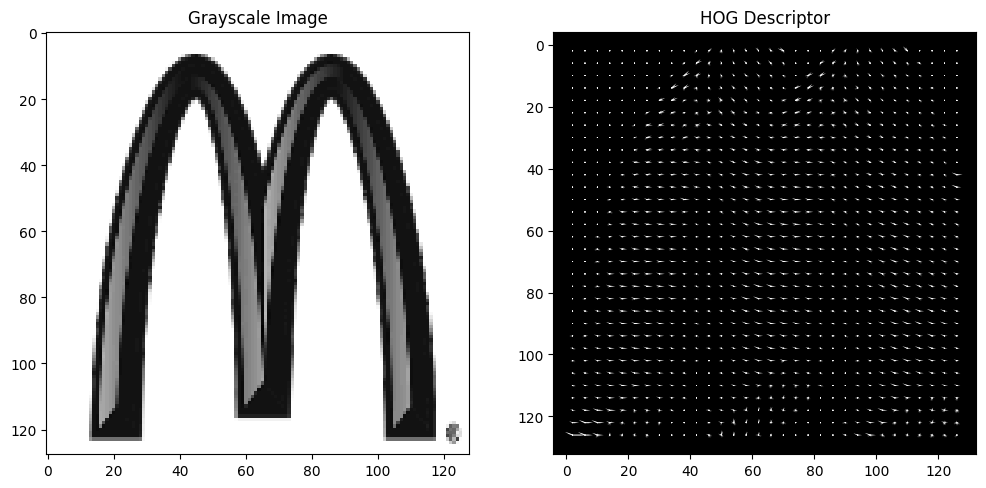

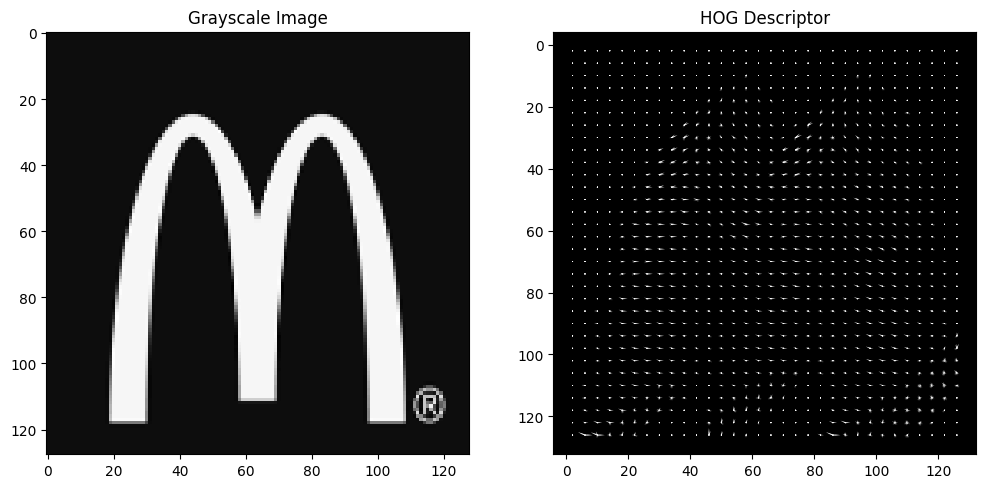

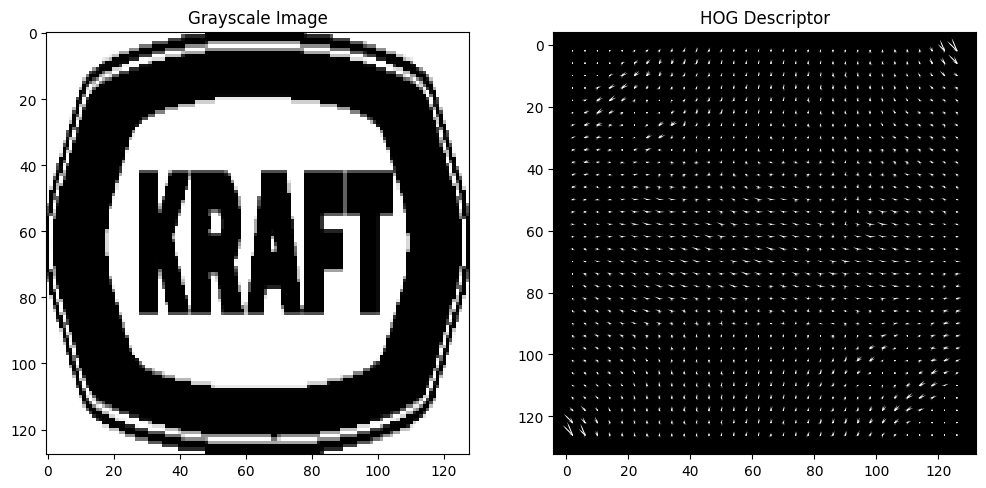

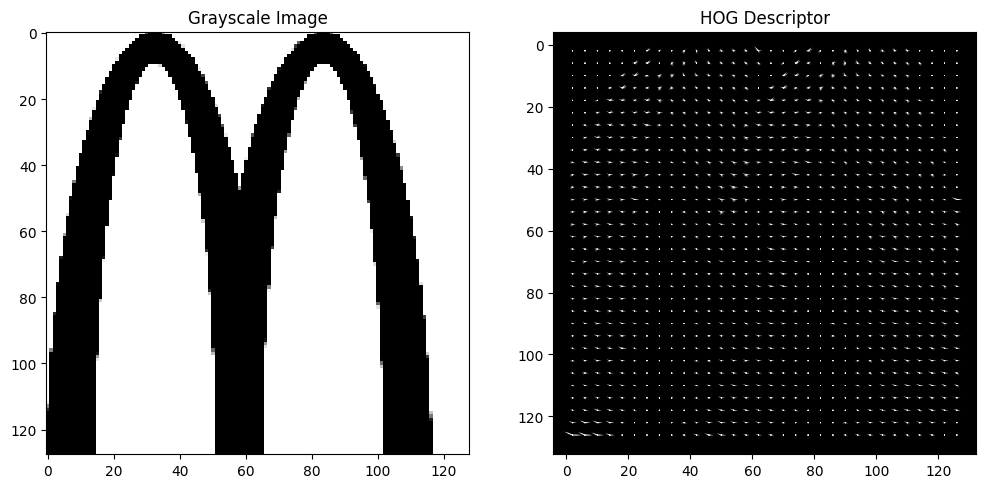

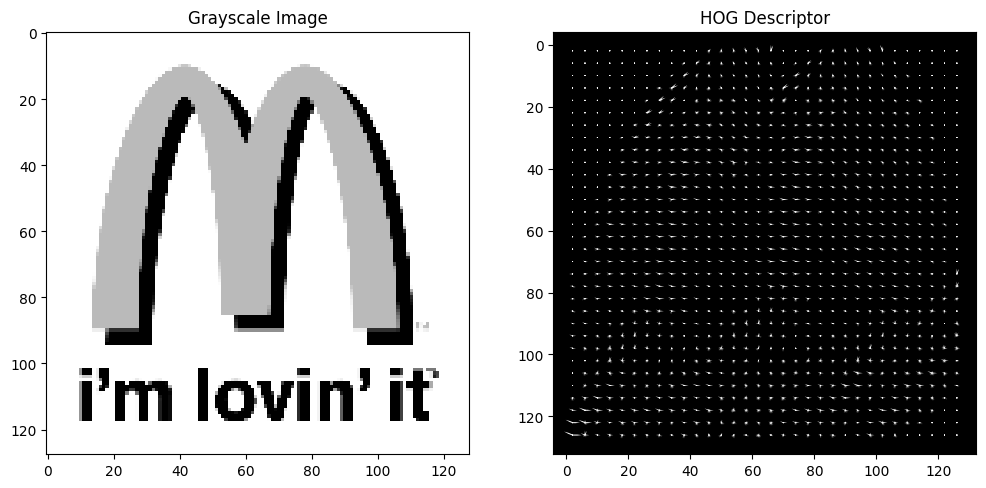

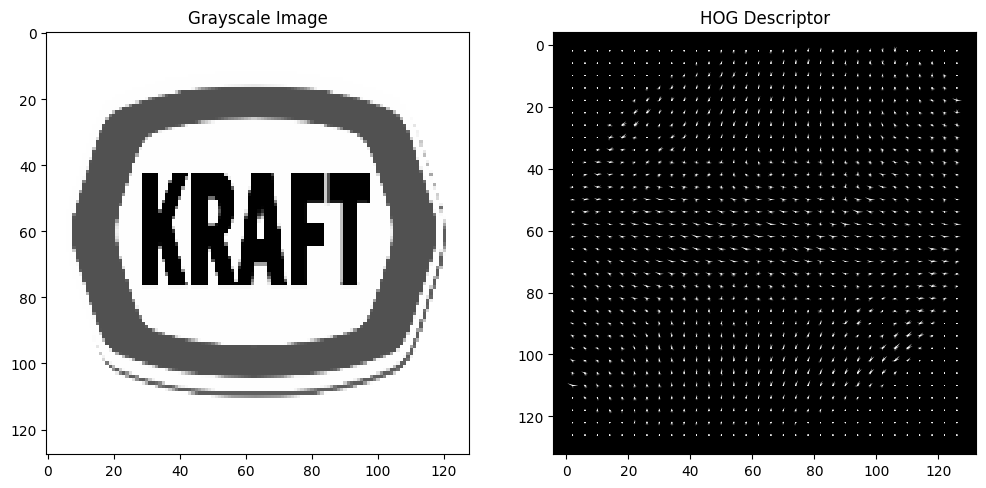

In [83]:
train_features = compute_HoG(train)


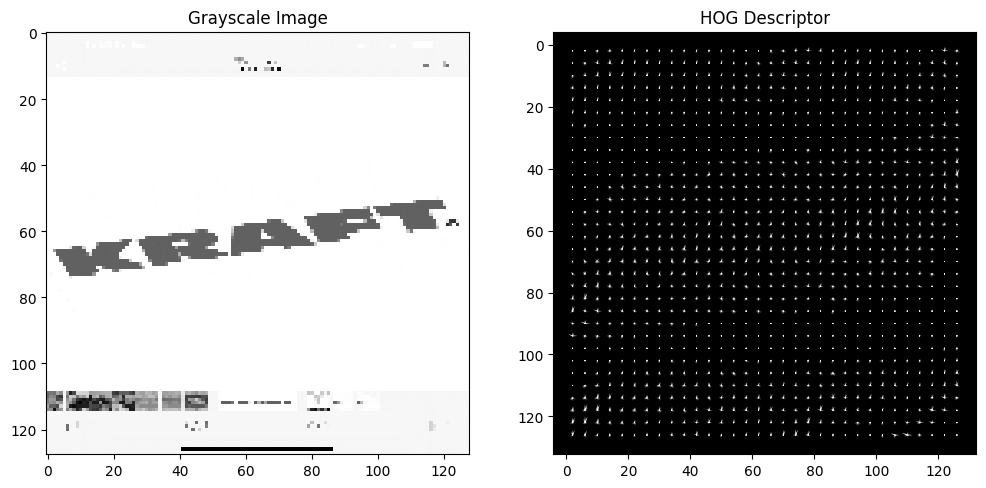

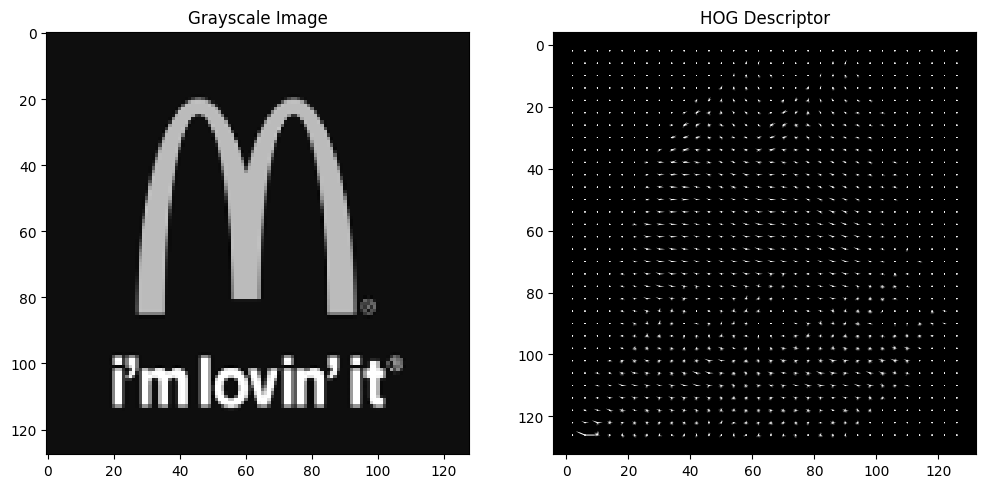

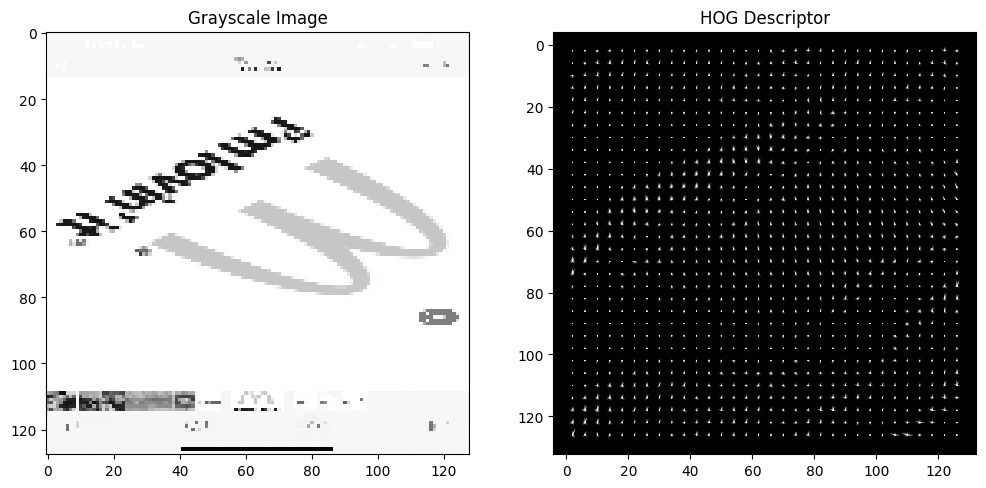

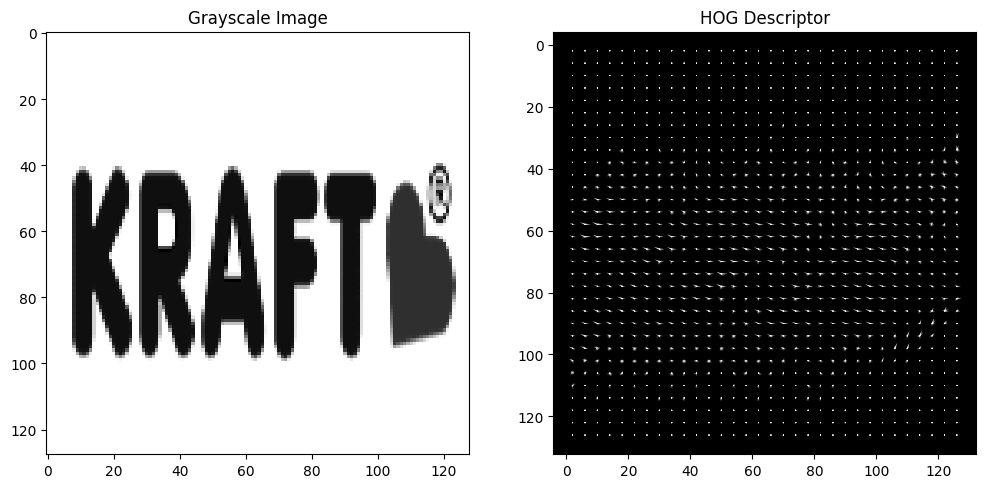

In [84]:
# HoG features on the test set
test_features = compute_HoG(test)


In [85]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score


In [86]:
# Create and fit the classifier
knn = KNeighborsClassifier()
knn.fit(train_features, y_train)
y_pred = knn.predict(test_features)


In [87]:
# Print our predictions
print("Predicted values: ", y_pred)
print("Real values: ", y_test)
print("Accuracy score: ", accuracy_score(y_test, y_pred))


Predicted values:  ['Kraft' 'Mac' 'Kraft' 'Kraft']
Real values:  ['Kraft', 'Mac', 'Mac', 'Kraft']
Accuracy score:  0.75


The classifier works well on all the test images except for the rotated MC image. HoG features are widely used in image classification for the following properties:,
- Robustness to different illuminations and contrasts: HoG features are computed based on the gradient of the image, which makes them robust to changes in illumination and contrast.,
- Invariance to affine transformation like translations and (small) rotations. HoG is also invariant to small changes in scale.,
- Localized feature: the features are computed in a localized manner, they described local properties instead of globals ones.
For classifying logos under rotations SIFT is a good method to retrieve features that are invariant to rotations. After, we can train a classifier (KNN, regressor, ...) using this features. We can also perform data augmentation adding some rotated logos to our training set.
Another techinque is Deep Learning in particular CNN with some pooling layers to achieve invariance to rotations.

# Part 2
In this part we will create a "panorama" of our flowers using three differents photos taken from different perpectives.
We will use homography and blending techiques to achieve our goal.

In [88]:
import cv2

In [89]:
path = "./"
q2_path = path + "Assignment2 Data/Q2/"


In [90]:
# Load our images
img1 = cv2.imread(q2_path + "image1.jpeg")
img2 = cv2.imread(q2_path + "image2.jpeg")
img3 = cv2.imread(q2_path + "image3.jpeg")
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)


In [91]:
""" 
Compute and returns:
- Keypoints
- Keypoints' descriptors
- Image with the corresponding keypoints 
"""
def sift(img):
    sift = cv2.SIFT_create()
    img1 = img.copy()
    # Compute keypoints and descriptors
    kp, ds = sift.detectAndCompute(img, None)
    # Draw the keypoints on the image
    img1 = cv2.drawKeypoints(
        img1, kp, img1, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    return kp, ds, img1


In [92]:
# Compute and returns all the keypoints and the descriptors for the images
# given in input
def compute_kp(imgs):
    # List containing the keypoints for each image
    kps = []    # i.e. kps[1] contains the keypoints of the image imgs[1]
    # List containing the descriptots for each image
    dss = []    # i.e. dss[1] contains the descriptors of the image imgs[1]
    total = len(imgs)

    # Compute the number of rows
    columns = 2
    plt.figure(figsize=(10, 10))
    rows = int(np.ceil(total / columns))

    # Iterate over all images
    for i, img in enumerate(imgs):
        # Compute kp and ds and the resulting image
        kp, ds, img = sift(img)

        # Plot the image with the keypoints
        plt.subplot(rows, columns, i+1)
        plt.title(f"SIFT features for image {i+1}")
        plt.xticks([])
        plt.yticks([])
        plt.imshow(img)
        kps.append(kp)
        dss.append(ds)
    plt.show()
    return kps, dss


In [93]:
# Compute and plot the matches for the input images given the respective keypoints and descriptors
def match_plot(img1, img2, ds1, ds2, kp1, kp2, title=""):

    img1_cp = img1.copy()
    img2_cp = img2.copy()

    # Match descriptors.
    # BFMatcher with default params
    bf = cv2.BFMatcher()
    matches = bf.match(ds1, ds2)

    # Sort them in the order of their distance.
    matches = sorted(matches, key=lambda x: x.distance)

    # Draw the matches across the two images
    img3 = cv2.drawMatches(
        img1_cp, kp1, img2_cp, kp2, matches[:20], None, flags=2)

    plt.figure(figsize=(10, 10))
    plt.title("Matches " + title)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(img3)
    plt.show()

    return matches


## Image 1 and image 2
In this section we will create the first part of our panorama calculating the homography between the first and second image.
Once we have our homography we can apply it to the first image and use pyramid blending to stich the images.

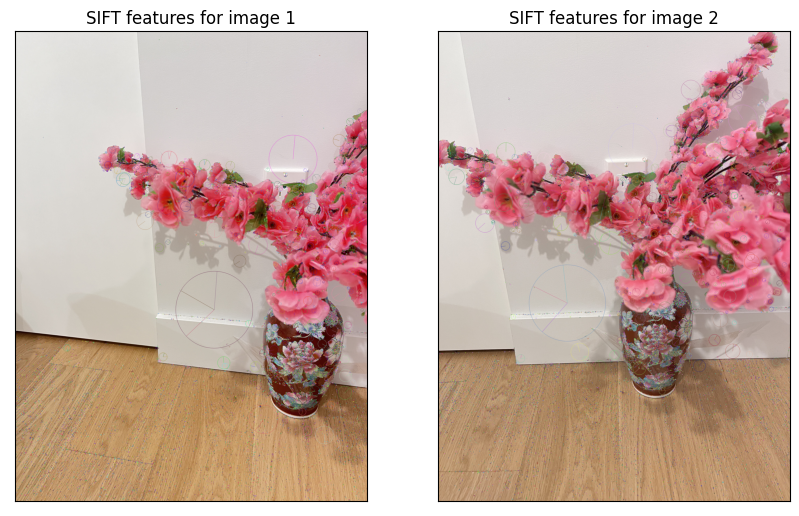

In [94]:
# Compute SIFT features for the first two images
kps, dss = compute_kp([img1, img2])


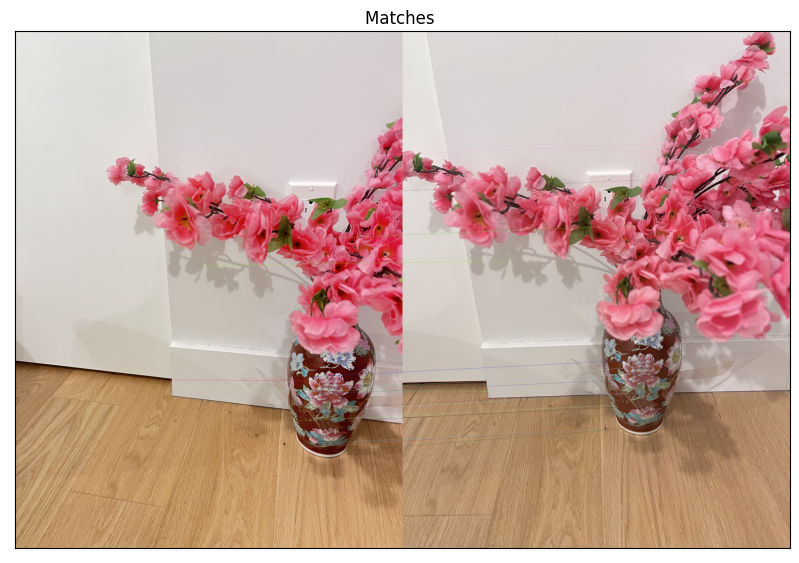

In [95]:
# Find matches between the two images using SIFT keypoints and descriptors
good = match_plot(
    img1, img2, dss[0], dss[1], kps[0], kps[1], title="")


In [96]:

def RANSAC(img1, img2, kp1, kp2, good, HEIGHT_BUFF=0):
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good])
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good])
    # Calculate Homography
    size = (img1.shape[1] + img2.shape[1], img1.shape[0])
    # Shift the keypoints:
    for i in range(len(dst_pts)):
        dst_pts[i][0] += img1.shape[1]

    # Used to move the transformed image downwards
    M = np.float32([[1, 0, 0], [0, 1, HEIGHT_BUFF], [0, 0, 1]])
    # Find the homography
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 4)
    # Apply the homography and create some empty space to stich the other image 
    homo_img = cv2.warpPerspective(img1, M.dot(H), size)
    stiched = homo_img.copy()
    img_right = np.zeros(
        (img2.shape[0], img2.shape[1] + img1.shape[1], 3), dtype=np.uint8)
    img_right[:, img1.shape[1]:] = img2
    stiched[:, img1.shape[1]:] = img2
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.title("Homography")
    plt.imshow(homo_img)
    plt.subplot(1, 2, 2)
    plt.title("Stiched images")
    plt.imshow(stiched)
    plt.show()
    return homo_img, img_right


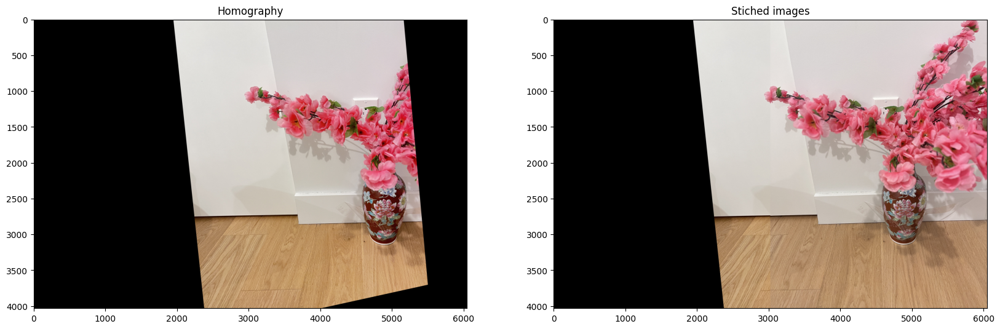

In [97]:
# Use RANSAC to find the best pair and apply the homography
img12, img_right = RANSAC(img1, img2, kps[0], kps[1], good[:20])


In [98]:
def boundingRect(img):
    """Compute and return the up-right bounding rectangle of a point set"""
    grayscale = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    ret, thresholded = cv2.threshold(grayscale, 0, 255, cv2.THRESH_BINARY)
    return cv2.boundingRect(thresholded)


def computeGaussianPyramid(img, pyr_depth):
    """Compute the gaussian pyramid given an image and pyramid depth. Return list of gaussian pyramid layers."""
    layer = img.copy()
    pyr_gauss = [layer]
    for i in range(pyr_depth):
        layer = cv2.pyrDown(layer)
        pyr_gauss.append(layer)
    return pyr_gauss


def computeLaplacianPyramid(pyr_gauss, pyr_depth):
    """Compute the laplacian pyramid given a gaussian pyramid and pyramid depth. Return list of laplacian pyramid layers."""
    layer = pyr_gauss[pyr_depth-1]
    pyr_lap = [layer]
    for i in range(pyr_depth-1, 0, -1):
        size = (pyr_gauss[i - 1].shape[1], pyr_gauss[i - 1].shape[0])
        gauss_expanded = cv2.pyrUp(pyr_gauss[i], dstsize=size)
        laplacian = cv2.subtract(pyr_gauss[i - 1], gauss_expanded)
        pyr_lap.append(laplacian)
    return pyr_lap


In [99]:
def blending(A, B):

    # Pyramid depth parameter
    PYR_DEPTH = 3

    # Copy images to avoid overwriting
    img_A = A.copy()
    img_B = B.copy()

    # Left clip
    xLeft = boundingRect(img_A)[0]
    img_A = img_A[:, xLeft:]
    img_B = img_B[:, xLeft:]
    print(img_A.shape)

    # Determine dimensions
    height, width, depth = img_B.shape
    x, y, width, height = boundingRect(img_B)

    # Create a img_real image before blending
    img_real = img_A.copy()
    img_real[y:y+height, x:x+width] = img_B[y:y+height, x:x+width]

    # Gaussian Pyramid 1 and 2 for img_A and img_B respectively
    pyr_gauss_1 = computeGaussianPyramid(img_A, PYR_DEPTH)
    pyr_gauss_2 = computeGaussianPyramid(img_B, PYR_DEPTH)

    # Compute Laplacian Pyramid 1 and 2 for img_A and img_B respectively
    pyr_lap_1 = computeLaplacianPyramid(pyr_gauss_1, PYR_DEPTH)
    pyr_lap_2 = computeLaplacianPyramid(pyr_gauss_2, PYR_DEPTH)

    # Merge of laplacian pyramids
    pyr_mountain = []
    n = 0
    for img_A_lap, img_B_lap in zip(pyr_lap_1, pyr_lap_2):
        n += 1
        _, rows, _ = img_A_lap.shape
        laplacian = img_A_lap.copy()
        laplacian = np.hstack(
            (img_A_lap[:, 0:int(rows/2)], img_B_lap[:, int(rows/2):]))
        pyr_mountain.append(laplacian)

    # Reconstruct photo
    img_reconstruct = pyr_mountain[0]
    for i in range(1, PYR_DEPTH):
        size = (pyr_mountain[i].shape[1], pyr_mountain[i].shape[0])
        img_reconstruct = cv2.pyrUp(img_reconstruct, dstsize=size)
        img_reconstruct = cv2.add(pyr_mountain[i], img_reconstruct)

    plt.figure(figsize=(10, 10))
    plt.subplot(211)
    plt.imshow(img_real)
    plt.title("Unblended"), plt.xticks([]), plt.yticks([])
    plt.subplot(212)
    plt.imshow(img_reconstruct)
    plt.title("Pyramid Blended"), plt.xticks([]), plt.yticks([])
    plt.tight_layout()
    plt.show()
    return img_reconstruct


(4032, 4103, 3)


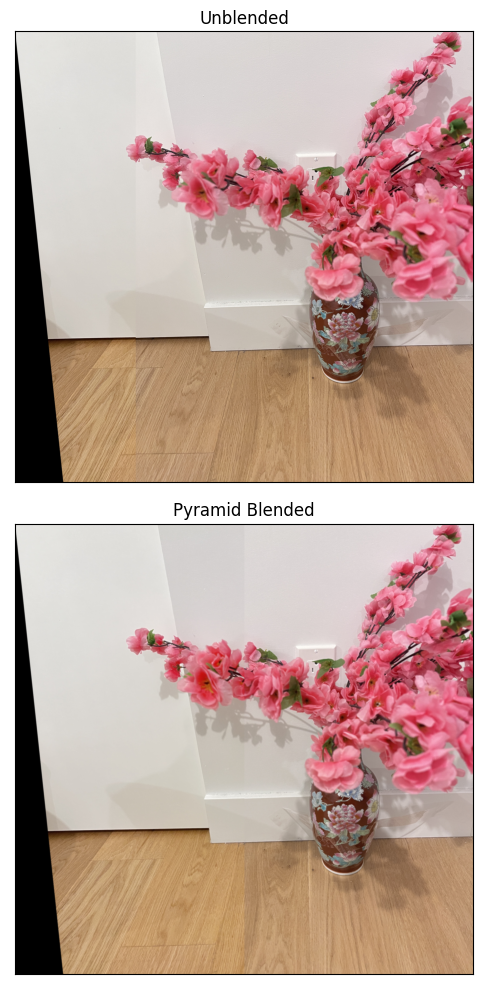

In [100]:
img12_blended = blending(img12, img_right)


## Image 12 and image 3
In this section we will use the blended image of the section to compute an homography for out third image.
Once the homography transformation is done we will apply a normal stiching with linear blendinf to complete our panorama of these flowers. 

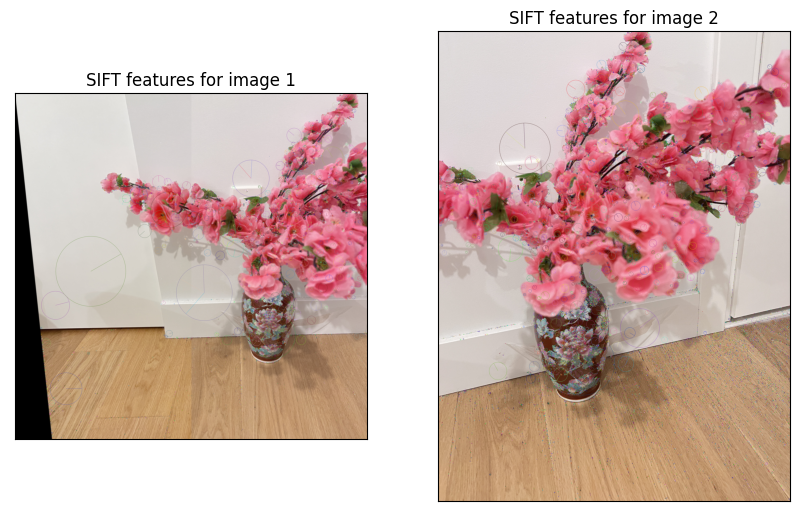

In [101]:
# Compute our keypoints and descriptors for the new stiched image and the last image to stich
kps, dss = compute_kp([img12_blended, img3])


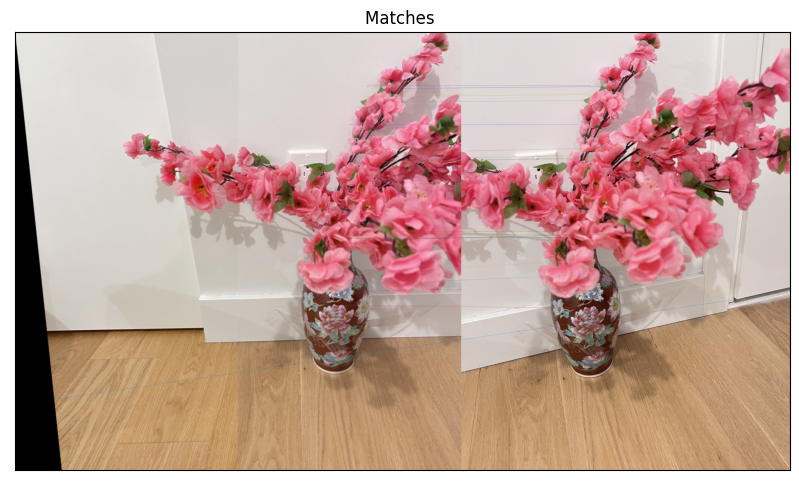

In [102]:
# Find good matches
good = match_plot(
    img12_blended, img3, dss[0], dss[1], kps[0], kps[1], title=""
)


In [103]:
# Similar to the RANSAC, this one perform the homography transformation for the right image and not for the left one
def RANSAC2(left_img, right_img, kp1, kp2, good, HEIGHT_BUFF=0):
    left_pts = np.float32([kp1[m.queryIdx].pt for m in good])
    right_pts = np.float32([kp2[m.trainIdx].pt for m in good])
    # Calculate Homography
    size = (left_img.shape[1] + right_img.shape[1],
            left_img.shape[0] + HEIGHT_BUFF)
    # Shift the keypoints:
    for i in range(len(right_pts)):
        right_pts[i][0] += left_img.shape[1]

    # Used to move the transformed image downwards
    M = np.float32([[1, 0, 0], [0, 1, HEIGHT_BUFF], [0, 0, 1]])


    N = np.float32([[1, 0, left_img.shape[1]], [0, 1, 0], [0, 0, 1]])

    H, mask = cv2.findHomography(right_pts, left_pts, cv2.RANSAC, 4)
    homo_img = cv2.warpPerspective(right_img, M.dot(H.dot(N)), size)
    stiched = homo_img.copy()
    img_left = np.zeros(
        (left_img.shape[0] + HEIGHT_BUFF, left_img.shape[1] + right_img.shape[1], 3), dtype=np.uint8)
    
    img_left[HEIGHT_BUFF: left_img.shape[0] + HEIGHT_BUFF, : left_img.shape[1], :] = left_img

    stiched[2 * HEIGHT_BUFF: left_img.shape[0] + HEIGHT_BUFF, : left_img.shape[1], :] = left_img[HEIGHT_BUFF:, :, :]

    plt.figure(figsize=(20, 20))
    plt.subplot(1, 2, 1)
    plt.title("Homography")
    plt.imshow(homo_img)
    plt.subplot(1, 2, 2)
    plt.title("Stiched images")
    plt.imshow(stiched)
    plt.show()
    return homo_img, img_left


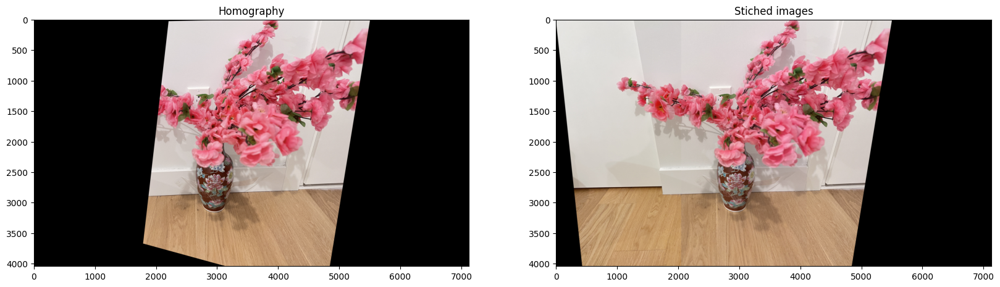

In [104]:
# Apply RANSAC to the images
img13, img_left = RANSAC2(
    img12_blended, img3, kps[0], kps[1], good[:20], HEIGHT_BUFF=9)


In [105]:
def linear_blending(img_left, img_right):
    """
    This cell applies and displays linear image blending to the stitched transformed 3Hill and 12Hill images.
    """
    img_A = img_left.copy()
    img_B = img_right.copy()

    # Determine height, width
    height, width = img_A.shape[0:2]
    # image with direct connecting each half
    #real = np.hstack((img_A[:, :round(height / 2)],
    #                 img_B[:, round(height / 2):]))

    """ ALPHA BLENDING """

    def Ramp(i_width, r_width, r_index, start, end):
        """
        Create alpha blending function
        :param i_width: img width
        :param r_width: ramp width
        :param r_index: center ramp index
        :param start: starting ramp value
        :param end: ending ramp value
        :return:
        """
        a = np.zeros((i_width))
        step = (end - start) / (r_width-1)
        # left side starting index of alpha ramp
        idx = round(r_index - (r_width / 2))
        for i in range(r_width):
            a[idx] = start + step*i
            idx += 1
        a[idx:] = 1
        return a

    # Alpha blending ramp
    RAMP_SIZE = 50
    alpha = Ramp(img_A.shape[1], RAMP_SIZE, round(img_A.shape[1] / 2), 0, 1)
    print(alpha.shape)
    # Now blend
    I_blend = (1 - alpha.reshape(1, -1, 1)) * \
        img_A + alpha.reshape(1, -1, 1) * img_B
    I_blend = np.uint8(I_blend)

    plt.figure(figsize=(20, 20))
    plt.imshow(I_blend)
    plt.title("Alpha Linear Blending"), plt.xticks([]), plt.yticks([])
    plt.tight_layout()
    plt.show()


(7127,)


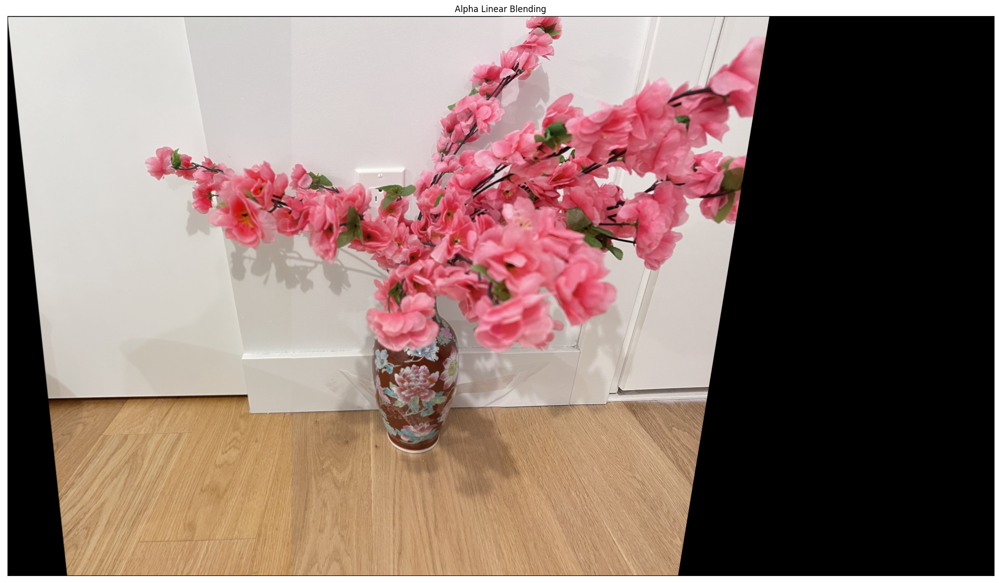

In [106]:
# Blend the stiched image
linear_blending(img_left, img13)


Discuss which method you prefer for stitching - pyramid blending or linear blending, and
why?

In this example the two methods do not present great differences. In general, pyramid blending is considered to be a more advanced and effective method than linear blending. This is because pyramid blending takes into account the different scales of the images and blends them accordingly. It also reduces the possibility of producing visible seams in the final image. Of course it is more computational expensive than linear blending.

# Face detection (10 points)

In [140]:
import os
import scipy as sp


In [141]:
def load_dataset(path, size):
    # Compute the size of our dataset
    n = len(os.listdir(path))
    size_f = size[0] * size[1]
    imgs = np.zeros((n, *size))
    imgs_f = np.zeros((n, size_f))
    # This will iterate in the Folder
    for i, img in enumerate(os.listdir(path)):
        # Image Path
        new_path = os.path.join(path, img)
        try:
            # Read Image
            img_data = cv2.imread(new_path)
            img_data = cv2.cvtColor(img_data, cv2.COLOR_BGR2GRAY)
            img_data_f = img_data.flatten()
            imgs[i] = img_data
            imgs_f[i] = img_data_f
        except:
            pass
    return imgs, imgs_f


In [142]:
q3_path = path + "/Assignment2 Data/Q3/celeb_faces/drive-download-20230205T204823Z-001/"


In [143]:
# Load our dataset
size = (218, 178)
train, train_f = load_dataset(q3_path, size)
n = train.shape[0]
print(train.shape)


(400, 218, 178)


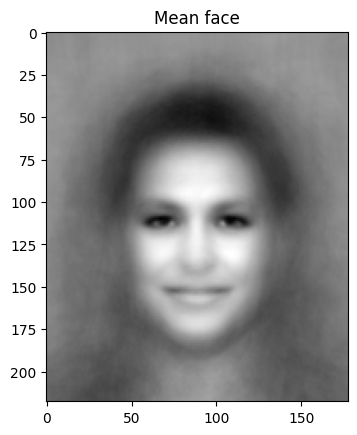

In [144]:
# Compute the mean face D
D = np.mean(train, axis=0)
plt.title("Mean face")
plt.imshow(D, "gray")


In [145]:
# Compute the DDT matrix which is SPD
DDT = D @ D.T
# Compute the eigenvalues and the eigenvectors
eigs, vectors = sp.linalg.eigh(DDT)
# Reverse the list to have the eigenvalues in a descending order
eigs = np.flip(eigs)
# First 4 eigenvalues
print("First four eigenvalues in descending order: ",eigs[:4])


First four eigenvalues in descending order:  [5.12472889e+08 6.22440320e+06 1.17487717e+06 4.18918329e+05]


In [146]:
# Function used to perform dimensionality reduction given
# the data X and the projection matrix Q
def project(Q, X):
    return np.dot(Q.T, X)


def pca(X, k, D):

    X_cp = X
    # Center our dataset
    x_centered = X_cp - D

    # Compute svd
    u, s, vh = np.linalg.svd(x_centered, full_matrices=False)

    # Truncate our eigenvectors matrix according to the number of dimension that we want
    u_truncated = np.resize(u, (X_cp.shape[0], k))
    u_truncated = u[:X_cp.shape[0], :k]

    # Project our datapoints
    Z = project(u_truncated, X_cp)

    return Z, u_truncated


In [147]:
# Number of dimension of the projected space
k = 2
X_train = train_f.T
Z, Q = pca(X_train[:, :100], k, D.flatten().reshape(-1, 1))


(38804, 2)


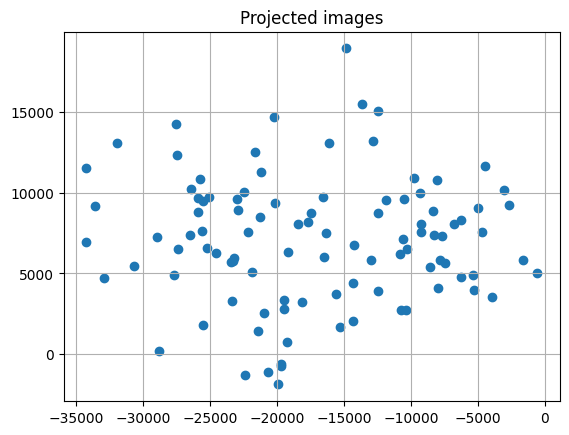

In [148]:
plt.title("Projected images")
plt.scatter(Z[0, :], Z[1, :])
plt.grid()
print(Q.shape)


Reconstruction error with k=20: 6983.0671870116985


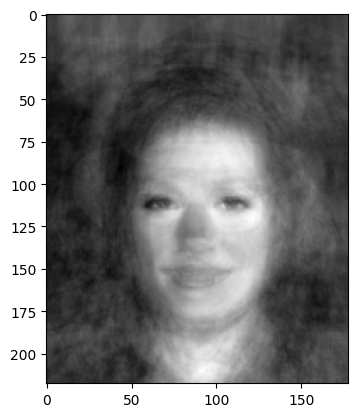

Reconstruction error with k=10: 8512.546402846221


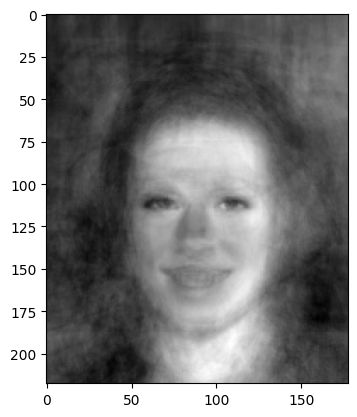

Reconstruction error with k=5: 11550.811516773072


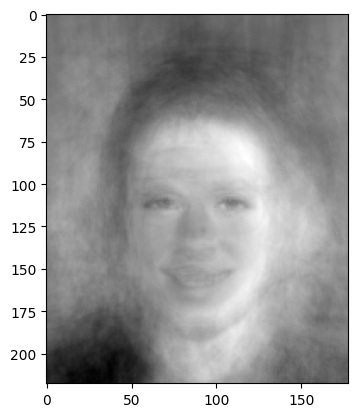

In [149]:
values = [20, 10, 5]
for k in values:
    # Compute the projection matrix and project our images
    Z, Q = pca(X_train[:, :], k, D.flatten().reshape(-1, 1))
    # Reconstruct the images
    originals = Q @ Z
    # Compute the reconstruction error
    print(
        f"Reconstruction error with k={k}: {np.mean(np.linalg.norm(originals - X_train, axis=0))}")
    # Show the reconstructed image for the first image
    plt.imshow(originals[:, 0].reshape(size), "gray")
    plt.show()


In [150]:
def face_recognition(img, win_size, Q, threshold):
    h, w = img.shape
    # Iterate over all the images using a window of the same size
    # of our images used for creating the projection matrix
    for i in range(w//win_size[1]):
        for j in range(h//win_size[0]):
            window = img[j*win_size[0]
                :(j+1)*win_size[0], i*win_size[1]: (i+1)*win_size[1]]
            # Project
            projection = project(Q, window.flatten())
            # Reconstruct
            recontruction = Q @ projection
            # If the reconstruction error is below a certain threshold it is a face
            if np.linalg.norm(window - recontruction.reshape(win_size)) < threshold:
                # Draw a bounding box around the face
                cv2.rectangle(
                    img, (i*win_size[1], j*win_size[0]), (i*win_size[1] + win_size[1], j*win_size[0] + win_size[0]), (255, 0, 0), 2)
            else:
                pass
    plt.imshow(img, cmap="gray")
    plt.show()


In [151]:
k = 10
Z, Q = pca(X_train[:, :], k, D.flatten().reshape(-1, 1))


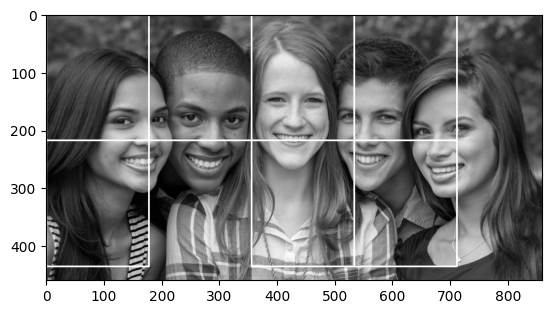

In [152]:
# Load our test image
img_test = cv2.imread(path + "test.png")
img_test = cv2.cvtColor(img_test, cv2.COLOR_BGR2GRAY)
threshold = 1e4
face_recognition(img_test, size, Q, threshold)


Describe how well the method works.

The methods does not really works well because:
- The window size must be of the same dimension of the images used for creating the projection matrix
- Deciding the stride of the window becomes crucial:
    - A small stride implies that the same face is recognized more than one time.
    - A bigger stride can make the recognizion less accurate, some faces can be missed.
- Also the choice of threshold is important to achieve good results.
    - A low threshold can bring false negative.
    - A high threshold can bring false positive.